<a href="https://colab.research.google.com/github/lzeng11bc/DNNWithTensorflow/blob/main/ch_17_autoencoder_and_gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Chapter 17. Representation Learning and Generative Learning Using Autoencoders and GANs
* **Autoencoders are artificial neural networks capable of learning dense representations of the input data, called *latent representations* or *encodings*, without any supervision(i.e., the training set is unlabeled).**
* **These codings typically have a much lower dimensionality than the input data, making autoencoders useful for dimensionality reduction, especially for visulization purposes**
* **Autoencoders also act as feature detectors, and they cannbe used for unsupervised pretraining of deep neural netowrks.**
* **Some autoencoders are *genrative models*: they are capable of randomly generating new data that looks very similar to ht etraiing data.**
* **GANs are now widely used for super resolution(increasing the resoluton of an image), colorization, powerful image editing(e.g., replacing photo bombers with realistic backgroud), turning a simple sketch into a photorealistic image, predictig the next frames in a video, augmenting a dataset(to train other models), generating other types of data(such as text, audio, and time series), identifying the weakness in other models and strengthening them, and more.**

##### Autoencoders vs. GANs
* **Autoencoders and GANs are both unsupervised, they both learn dense representations, they can both be used as generative models, and they have many similar applications.**
* **Autoencoders simply learn to copy their inputs to their outputs. This may sound like a trivial task, but we will see that constraining the network in various ways can make it rather difficult. These constraints preven the autoencoder from trivially copying the inputs directly to the outputs, which forces it to learn efficient ways of representing the data. In short, the codings are byproducts of the autoencder learning the identity function under some constraints.**
* **GANs are composed of two neural networks: a *generator* that tries to generate data that looks similar to the training data, and a discriminator that tires to tell real data from fake data.**
    * **This architecture is bery original in Deep Learning in that the generator and the discriminator compete against each otehr during training.**



## Efficient Data Representations


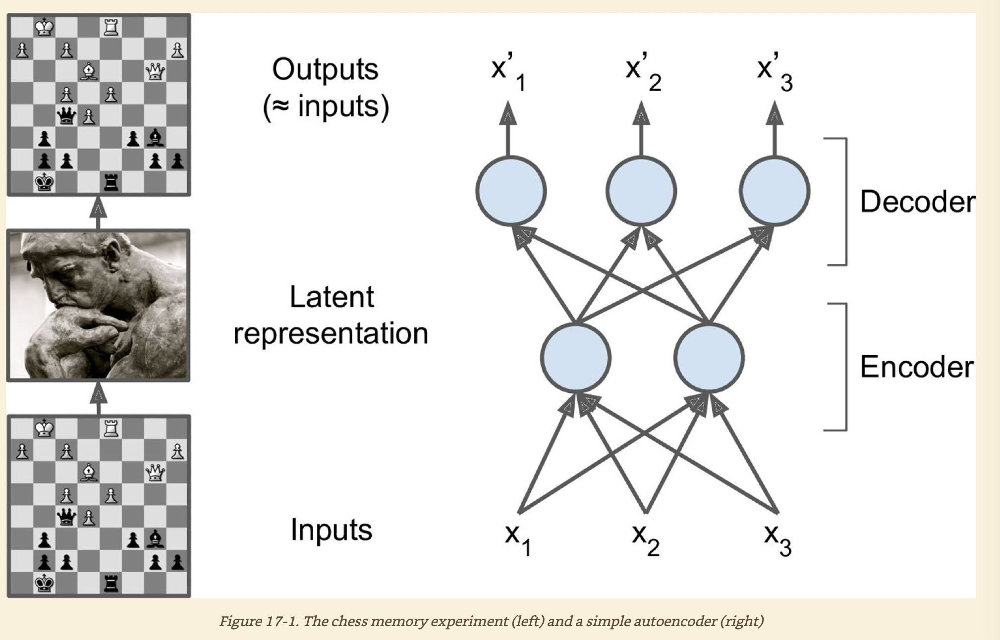

* **An autoencoder looks at the inputs, converts them to an efficient latent representation, and then spits out something that looks very close to the inputs.**
* **An autoencder is always composed of two parts: an *encoder*(or *recognition network*) that converts the inputs to a latent rperesentation, followed by a *decoder*(or *generative network*) that converts the internal representation to the outpts.**
* **An autoeencoder typically has the same architecture as a Multi-Layer Perceptron, except that the number of neurons in the output layer must be equal to the number of inputs.**
    * **In this example, there is just one hidden layer composed of two neurons(the encoder), and one output layer composed of three neurons(the decoder).**
    * **The outputs are often called the *reconstruction* because the autoencoder troed to reconstruct the inputs, and the cost function contains a *reconstructions loss* that penalizes the model when the reconstruction is different from the inputs.**
* **Because the interal representation has a lower dimensionality than the input data(it is 2D instead of 3D), the autoencoder is said to be *undercomplete*.**
    * **An undercomplete autoencder cannot trivially copy its inputs to the encodings, yet it must find a way to output a copy of its inputs. It is forced to learn the most important features in the input data(and drop the unimportant ones).**

## Performing PCA with an Undercomplete Linear Autoencoder
* **If the autoencoder uses only linear activations and the cost function is the mean squared error(MSE), then it ends up performing Principal Component Analysis(PCA).**
* **The following code builds a simple linear autoencoder to perform PCA on a 3D dataset, projecting it to 2D.**

In [ ]:
from tensorflow import keras

encoder = keras.models.Sequential([keras.layers.Dense(2, input_shape=[3])])
decoder = keras.models.Sequential([keras.layers.Dense(3, input_shape=[2])])
autoencoder = keras.models.Sequential([encoder, decoder])

autoencoder.compile(loss="mse", optimizer=keras.optimizers.SGD(lr=0.1))

* **We orgnized the autoencoder into two subcomponents: the encoder and the deocder. Both are regular** Sequential **models with a single** Dense **layer each, and the autoencoder is a** Sequential **model containing the encoder followed by the decoder(remember that a model can be used as a layer in another model)**
* **The autoencoder's number of outputs is equal to the number of inputs**
* **To perform a simple PCA, we do not use any activation function(i.e., all neurons are linear), and the cost function is the MSE.**

* **Let's train the model on a simple generated 3D dataset and use it to encode the same dataset(i.e., project it to 2D).**

In [ ]:
# generate 3D dataset
import numpy as np

np.random.seed(4)

def generate_3d_data(m, w1=0.1, w2=0.3, noise=0.1):
    angles = np.random.rand(m) * 3 * np.pi / 2 - 0.5
    data = np.empty((m, 3))
    data[:, 0] = np.cos(angles) + np.sin(angles)/2 + noise * np.random.randn(m) / 2
    data[:, 1] = np.sin(angles) * 0.7 + noise * np.random.randn(m) / 2
    data[:, 2] = data[:, 0] * w1 + data[:, 1] * w2 + noise * np.random.randn(m)
    return data

X_train = generate_3d_data(60)
X_train = X_train - X_train.mean(axis=0, keepdims=0)

In [ ]:
history = autoencoder.fit(X_train, X_train, epochs = 20)
codings = encoder.predict(X_train)

Epoch 1/20
2/2 [==============================] - 0s 5ms/step - loss: 0.8229
Epoch 2/20
2/2 [==============================] - 0s 8ms/step - loss: 0.5889
Epoch 3/20
2/2 [==============================] - 0s 3ms/step - loss: 0.4867
Epoch 4/20
2/2 [==============================] - 0s 4ms/step - loss: 0.4429
Epoch 5/20
2/2 [==============================] - 0s 3ms/step - loss: 0.3817
Epoch 6/20
2/2 [==============================] - 0s 4ms/step - loss: 0.3732
Epoch 7/20
2/2 [==============================] - 0s 4ms/step - loss: 0.3402
Epoch 8/20
2/2 [==============================] - 0s 3ms/step - loss: 0.3249
Epoch 9/20
2/2 [==============================] - 0s 4ms/step - loss: 0.3093
Epoch 10/20
2/2 [==============================] - 0s 3ms/step - loss: 0.3015
Epoch 11/20
2/2 [==============================] - 0s 4ms/step - loss: 0.2860
Epoch 12/20
2/2 [==============================] - 0s 3ms/step - loss: 0.2733
Epoch 13/20
2/2 [==============================] - 0s 3ms/step - loss: 0.

* **Note that the same dataset,** X\_train **is used as both the inputs and the targtes.**
* **As you can see, the autoencoder found the best 2D plane to project the data onto, preserving as much variance in the data as it could(just like PCA).**

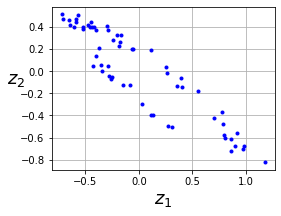

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(4,3))
plt.plot(codings[:,0], codings[:, 1], "b.")
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)
plt.show()

* **You can think of autoencoders as a form of self-supervised leanring(i.e., using a supervised learning technique with automatically generated labels, in this case simply equal to the inputs)**

## Stacked Autoencoders
* **Autoencoders can have multiple hidden layers, in this case they are called *stacked autoencoders*(or *deep autoencoders*)**
* **Adding more layers helps the autoencoder learn more complex codings.**
* **That said, one must be careful not to make the autoencoder too powerful. Imagine an encoder so powerful that it just learns to map each input to a single aribitrary number(and the decoder learns the reverse mapping).**
    * **Obviously such an autoencoder will reconstruct the training data perfectly, but it will not have learend any data representation in the process(and it is unlikely to generalize well to new instances).**

* **The architecture of a stacked autoencoder is typically symmetrical with regard to the central hidden layer(the coding layer).**

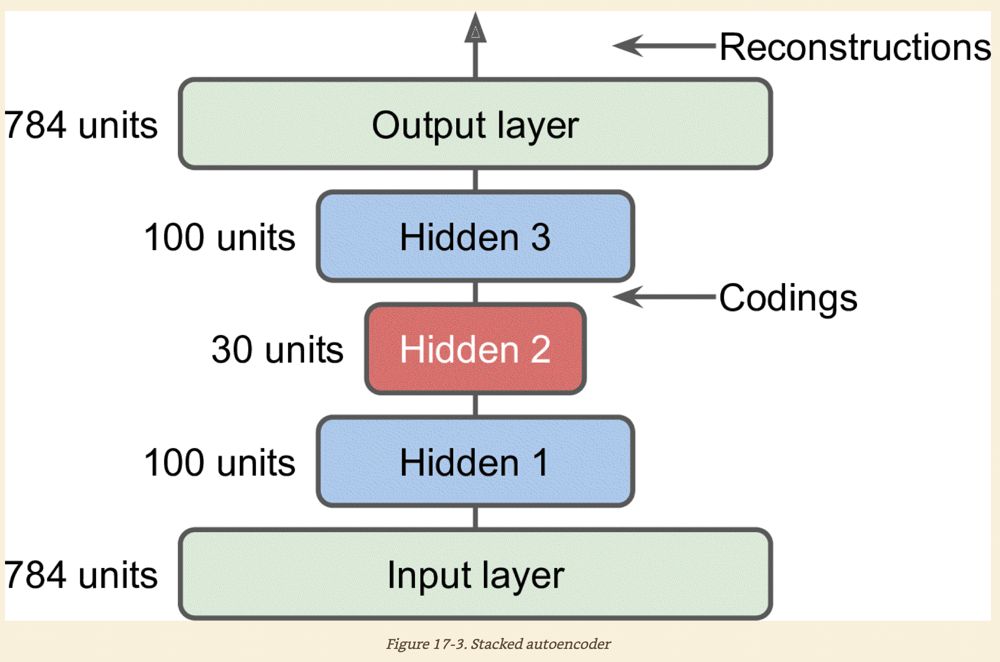

* **An autoencoider for MNIST may have 784 inputs, followed by a hidden layer with 100 neurons, then a central hidden layer of 30 neurons, then another hidden layer with 100 neurons, and an output layer with 784 neurons.**

### Implementing a Stacked Autoencoder Using Keras
* **You can implement a stacked autoencder very much like a regular MLP.**
* **The following code builds a stacked autoencoder for Fashion MNIST(loaded and normalized), using SELU activation function.**

In [ ]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

4423680/4422102 [==============================] - 0s 0us/step


In [ ]:
def rounded_accuracy(y_true, y_pred):
    return keras.metrics.binary_accuracy(tf.round(y_true), tf.round(y_pred))

In [ ]:
import tensorflow as tf

In [ ]:
stacked_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu"),
])
stacked_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
stacked_ae = keras.models.Sequential([stacked_encoder, stacked_decoder])
stacked_ae.compile(loss="binary_crossentropy",
                   optimizer=keras.optimizers.SGD(lr=1.5), metrics=[rounded_accuracy])
history = stacked_ae.fit(X_train, X_train, epochs=20,
                         validation_data=(X_valid, X_valid))

Epoch 1/20
1719/1719 [==============================] - 8s 4ms/step - loss: 0.3818 - rounded_accuracy: 0.8486 - val_loss: 0.3119 - val_rounded_accuracy: 0.9100
Epoch 2/20
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3085 - rounded_accuracy: 0.9127 - val_loss: 0.3024 - val_rounded_accuracy: 0.9197
Epoch 3/20
1719/1719 [==============================] - 8s 4ms/step - loss: 0.3007 - rounded_accuracy: 0.9198 - val_loss: 0.3030 - val_rounded_accuracy: 0.9120
Epoch 4/20
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2960 - rounded_accuracy: 0.9237 - val_loss: 0.2945 - val_rounded_accuracy: 0.9272
Epoch 5/20
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2934 - rounded_accuracy: 0.9263 - val_loss: 0.2922 - val_rounded_accuracy: 0.9294
Epoch 6/20
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2912 - rounded_accuracy: 0.9278 - val_loss: 0.2917 - val_rounded_accuracy: 0.9271
Epoch 7/20
1719/1719 [==================

* **We split the autoencoder model into tow submodels: the encoder and the decoder**
* **The encoder takes 28 x 28-pixel grayscale images, flatten them so that each image is represented as a vector of size 784, then processes these vectors through two** Dense **layers of diminishing sizes(100 units then 30 units), both using the SELU activation function. For each input image, the encoder outputs a vector of size 30.**
* **The odecoder takes codings of size 30(output by the encoder) and process them through two** Dense **layers of increasing sizes(100 units then 784 units), and it reshapes the final vectors into 28 x 28 arrays so the decoder's outputs have the same shape as the encoder's inputs.**
* **When compiling the stacked autoencoder, we use the binary cross-entropy loss instead of the mean squared error. We are treating the reconstruction task as a multilabel binary classification problem: each pixel intensity represents the probability that the pixel should be black. This allows the model to converge faster.**
* **Finally, we train the model using** X\_train **as both the inputs and the targets(and similarly. we use**X\_valid **as both the validation inputs and targets)**

### Visulizing the Reconstruction
* **One way to ensure that an autoencoder is preoperly trained is to compare the inputs and the outputs: the difference should not be too significant. Let's plot a few images from the validation set, as well as their reconstruction**

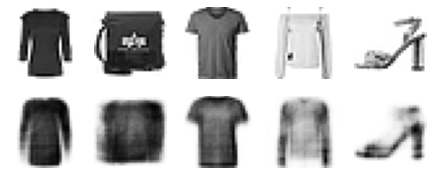

In [ ]:
def plot_image(image):
    plt.imshow(image, cmap="binary")
    plt.axis("off")

def show_reconstructions(model, n_images=5):
    reconstructions = model.predict(X_valid[:n_images])
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plot_image(X_valid[image_index])
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plot_image(reconstructions[image_index])

show_reconstructions(stacked_ae)

* **The reconstructions are recognizable, but a bit too lossy. We may need to train the model for longer, or make the encoder and decoder deeper, or make the codings larger.**

### Visualizing the Fashion MNIST Dataset
* **We can train a stacked autoencoder, and use it to the dataset's dimensionality.**
* **For visulization, this does not give great results compared to other dimensionality reduction algorithms.**
* **One big advantage of autoencoders is that they can handle large datasets, with many instances and many features.**
* **One strategy is to use an autoencoder to reduce the diemnsionality down to a reasonable levle, then use another diemensionality reduction algorithm for visulatization.**

* **Let's use this strategy to visualize Fashion MNIST.**
* **First, we use the encoder from our stacked autoencoder to reduce the dimensionality down to 30,  then we use Scikit-Learns's implementation of the t-SNE algorithm to reduce the dimensionality down to 2 for visualization.**

In [ ]:
from sklearn.manifold import TSNE

X_valid_compressed = stacked_encoder.predict(X_valid)
tsne = TSNE()
X_valid_2D = tsne.fit_transform(X_valid_compressed)

**Now we can plot the dataset**

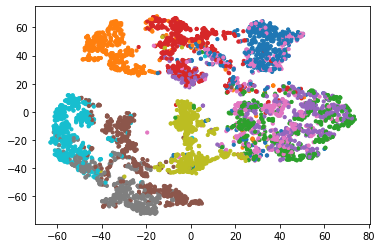

In [ ]:
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap="tab10")

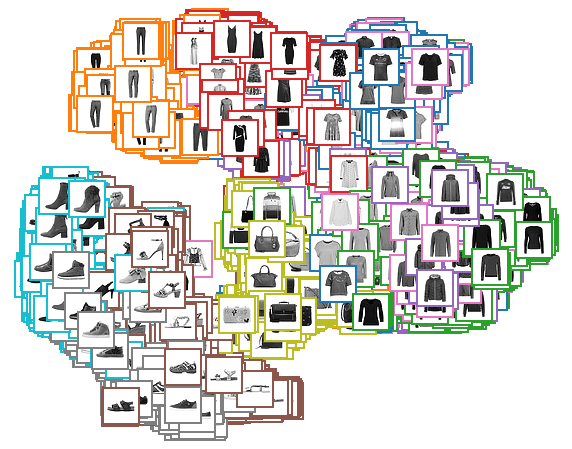

In [ ]:
import matplotlib as mpl

plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(X_valid_2D):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

### Unsupervised Pretraining Using Stacked Autoencoders
* **If you have large dataset but most of it is unlabeled, you can fits train a stacked autoencoder using all the data, then reuse the lower layers to create a neural network for your actual taska and train it using the labeled data.**

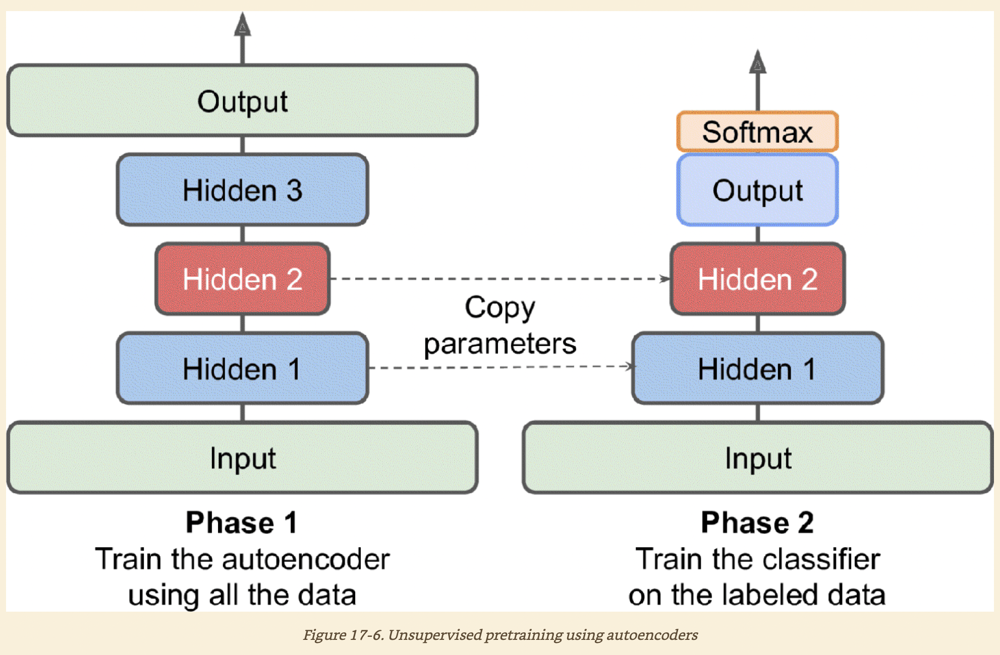

* **Train an autoencoder using all the training data(labeled plus unlabeled), then reuse its encoder layers to create a new neural network.**

**Techniques for training stacked autoencoders**<br>

### Tying Weights
* **When an autoencoder is neatly symmetrical, a cokmon technique is to *tie* the weights of the deconder layers to the weights of the encoder layers.**
    * **This halves the number of weights in the model, speeding up training and limiting the risk of overfitting**
* **If the autoencoder has a total of *N* layers)not counting the input layer, and $\pmb{W}_L$ represents the connections weights of the $L^{th}$ layer, then the decoder layer weights can be defines simply as $\pmb{W}_{N-L+1} = \pmb{W}_L^T$(with $L =1, 2,..., N/2$)**

**To tie weights between layers using Keras, let's define a custom layer**

In [6]:
class DenseTranspose(keras.layers.Layer):
    def __init__(self, dense, activation=None, **kwargs):
        self.dense = dense
        self.activation = keras.activations.get(activation)
        super().__init__(**kwargs)
    
    def build(self, batch_input_shape):
        self.biases = self.add_weight(name="bias", initializer="zeros",
                                      shape=[self.dense.input_shape[-1]])
        super().build(batch_input_shape)
    
    def call(self, inputs):
        z = tf.matmul(inputs, self.dense.weights[0], transpose_b=True)
        return self.activation(z + self.biases)

* **This custom layer acts like a regular** Dense **layer, but it ses another** Dense **layer's weights, transposed(setting** transpose\_b=True **is equivalent to transposing the second argument, but it's more efficient as it performs the transposition on the fly within the** matmul( ) **operation**)
* **However, it uses its own bias vector.**
* **Next, we can build a new stacked autoencoder, much like the previous one, but with the decoder's** Dense **layers tied to the encoder's** Dense **layers**

In [7]:
dense_1 = keras.layers.Dense(100, activation="selu")
dense_2 = keras.layers.Dense(30, activation="selu")

tied_encoder = keras.models.Sequential([
                                        keras.layers.Flatten(input_shape=[28, 28]),
                                        dense_1, 
                                        dense_2
])

tied_decoder = keras.models.Sequential([
                                        DenseTranspose(dense_2, activation="selu"),
                                        DenseTranspose(dense_1, activation="sigmoid"),
                                        keras.layers.Reshape([28, 28])
])

tied_ae = keras.models.Sequential([tied_encoder, tied_decoder])

### Training One Autoencoder at a Time
* **Rather than training the whole stacked autoencoder in one go, it is possible to train one shallow autoencoder at a time, then stack all of them into a single stacked autoencder.**

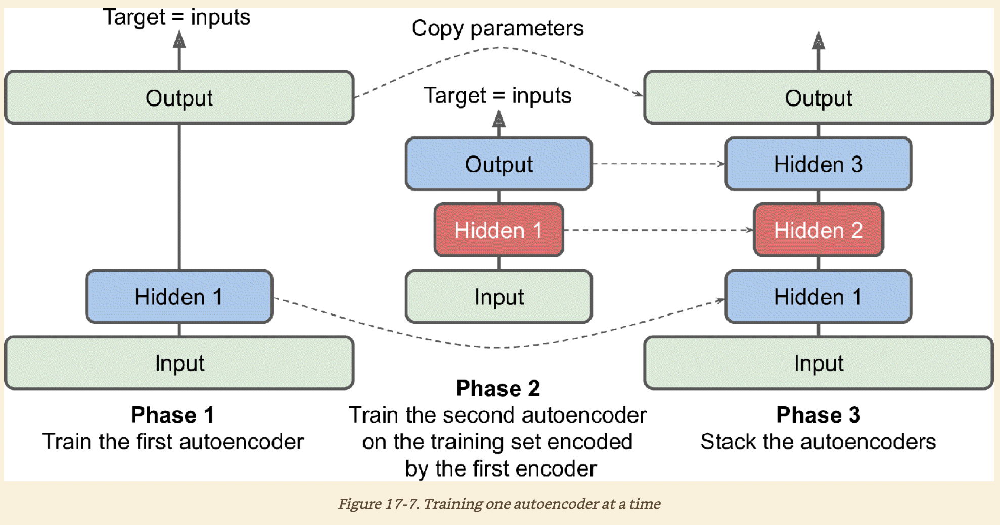